![](http://images.plot.ly/logo/plotlyjs-logo@2x.png)

# Hands on with Plot.ly

> Plotly is the collaboration platform for modern data science.

## Plotly : Offline Use

**Notebook Mode** - Inside Jupyter/IPython Notebooks

In [7]:
import pandas as pd
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode() # run at the start of every notebook

In [8]:
iplot({
    "data": [{
        "x": [1, 2, 3],
        "y": [4, 2, 5]
    }],
    "layout": {
        "title": "hello world"
    }
})

In [9]:
import plotly.tools as tls
# Plotly is very flexible
tls.embed('plotly2_demo','219')

In [10]:
import plotly.tools as tls
# And expressive
tls.embed('PythonPlotBot','25')

## Basics

`plotly` charts are described _declaratively_ with objects in `plotly.graph_objs` and `dict`. Every aspect of a plotly chart (the colors, the grids, the data, and so on) has a corresponding key-value attribute in these objects. The [reference page](https://plot.ly/python/reference/) contains an extensive list of these attributes.

Plotly's graph description places attributes into two categories: **traces** (objects that describe a single series of data in a graph like Scatter or Heatmap) and **layout** attributes that apply to the rest of the chart, like the title, xaxis, or annotations).

Here is a simple example of a plotly chart inlined with links to each attribute's reference section.

In [11]:
from plotly.graph_objs import Scatter, Bar, Layout, Figure

data = [
    Scatter(                            # all "scatter" attributes: https://plot.ly/python/reference/#scatter
        x=[1, 2, 3],                    # more about "x":  /python/reference/#scatter-x
        y=[3, 1, 6],                    # more about "y":  /python/reference/#scatter-y
        mode="markers+lines",
        marker=dict(                    # marker is an dict, marker keys: /python/reference/#scatter-marker
            color="rgb(16, 32, 77)"     # more about marker's "color": /python/reference/#scatter-marker-color
        )
    ),
    Bar(                            # all "bar" chart attributes: /python/reference/#bar
        x=[1, 2, 3],                # more about "x": /python/reference/#bar-x
        y=[3, 1, 6],                # /python/reference/#bar-y
        name="bar chart example"    # /python/reference/#bar-name
    )
]

layout = Layout(                # all "layout" attributes: /python/reference/#layout
    title="simple example",     # more about "layout's" "title": /python/reference/#layout-title
    xaxis=dict(                 # all "layout's" "xaxis" attributes: /python/reference/#layout-xaxis
        title="time"            # more about "layout's" "xaxis's" "title": /python/reference/#layout-xaxis-title
    ),
    annotations=[
        dict(                            # all "annotation" attributes: /python/reference/#layout-annotations
            text="simple annotation",    # /python/reference/#layout-annotations-text
            x=0,                         # /python/reference/#layout-annotations-x
            xref="paper",                # /python/reference/#layout-annotations-xref
            y=0,                         # /python/reference/#layout-annotations-y
            yref="paper"                 # /python/reference/#layout-annotations-yref
        )
    ]
)

figure = Figure(data=data, layout=layout)

iplot(figure)

The full set of [Plotly Tutorials](https://plot.ly/python/) give you a great idea of what's possible _and_ on how you might implment them with python.

## Cheatsheet

In [12]:
from IPython.display import IFrame
IFrame('https://images.plot.ly/plotly-documentation/images/python_cheat_sheet.pdf',986,600)

## Chart Types

### Basic Charts

In [15]:
trace1 = Bar(
    x=[1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012],
    y=[219, 146, 112, 127, 124, 180, 236, 207, 236, 263, 350, 430, 474, 526, 488, 537, 500, 439],
    name='Rest of world',
    marker=dict(
        color='rgb(55, 83, 109)'
    )
)
trace2 = Bar(
    x=[1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012],
    y=[16, 13, 10, 11, 28, 37, 43, 55, 56, 88, 105, 156, 270, 299, 340, 403, 549, 499],
    name='China',
    marker=dict(
        color='rgb(26, 118, 255)'
    )
)
data = [trace1, trace2]

layout = Layout(
    title='US Export of Plastic Scrap',
    xaxis=dict(
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='USD (millions)',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1
)

fig = Figure(data=data, layout=layout)
plot_url = iplot(fig)

### Statistical Charts

In [16]:
import numpy as np
import plotly.figure_factory as ff

In [17]:
x,y = np.meshgrid(np.arange(-2, 2, .2),
                  np.arange(-2, 2, .25))
z = x*np.exp(-x**2 - y**2)
v, u = np.gradient(z, .2, .2)

# Create quiver figure
fig = ff.create_quiver(x, y, u, v,
                       scale=.25,
                       arrow_scale=.4,
                       name='quiver',
                       line=dict(width=1))

# Create points
points = Scatter(x=[-.7, .75], y=[0,0],
                    mode='markers',
                    marker=dict(size=12),
                    name='points')

# Add points to figure
fig['data'].append(points)

iplot(fig)

In [18]:
import pandas as pd

df2 = pd.DataFrame(np.random.randn(10, 4),
                         columns=['Facebook', 'Twitter', 'Instagram', 'Snapchat'])

df2['Contents'] = pd.Series(['apple', 'apple', 'grape', 'apple', 'apple', 'grape', 'pear', 'pear', 'apple', 'pear'])


fig = ff.create_scatterplotmatrix(df2, diag='box', index='Contents',
                                  height=800, width=800)
iplot(fig)

In [19]:
df3 = pd.DataFrame(np.random.randn(20, 4),
                         columns=['Column A', 'Column B', 'Column C', 'Column D'])

df3['Contents'] = pd.Series(['apple', 'apple', 'grape', 'apple', 'apple',
                                'grape', 'pear', 'pear', 'apple', 'pear',
                                'apple', 'apple', 'grape', 'apple', 'apple',
                                'grape', 'pear', 'pear', 'apple', 'pear'])


fig = ff.create_scatterplotmatrix(df3, diag='histogram', index='Contents',
                                  height=800, width=800)
iplot(fig)

In [20]:
df4 = pd.DataFrame(np.random.randn(100, 3),
                   columns=['Column A', 'Column B', 'Column C'])

fig = ff.create_scatterplotmatrix(df4, diag='box', index='Column A',
                                  endpts=[-1, 0, 1],
                                  height=800, width=800, size=12,
                                  marker=dict(symbol=25))

iplot(fig)


### Maps

In [21]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')

In [22]:
df.head(10)

,COUNTRY,GDP (BILLIONS),CODE
0,Afghanistan,21.71,AFG
1,Albania,13.40,ALB
2,Algeria,227.80,DZA
3,American Samoa,0.75,ASM
4,Andorra,4.80,AND
5,Angola,131.40,AGO
6,Anguilla,0.18,AIA
7,Antigua and Barbuda,1.24,ATG
8,Argentina,536.20,ARG
9,Armenia,10.88,ARM


In [23]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')

data = [ dict(
        type = 'choropleth',
        locations = df['CODE'],
        z = df['GDP (BILLIONS)'],
        text = df['COUNTRY'],
        colorscale = [[0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
            [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"]],
        autocolorscale = False,
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            )
        ),
        colorbar = dict(
            tickprefix = '$',
            title = 'GDP<br>Billions US$'
        ),
    ) ]

layout = dict(
    title = '2014 Global GDP<br>Source: \
    <a href="https://www.cia.gov/library/publications/the-world-factbook/fields/2195.html"> CIA World Factbook</a>',
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'Mercator'
        )
    )
)

fig = dict(data=data, layout=layout)
iplot(fig)

### 3D Charts

In [24]:
from plotly.graph_objs import Scatter3d

# Get Data: this ex will only use part of it (i.e. rows 750-1500)
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv')

trace1 = Scatter3d(
    x=df['year'][750:1500],
    y=df['continent'][750:1500],
    z=df['pop'][750:1500],
    text=df['country'][750:1500],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        sizeref=750,
        size=df['gdpPercap'][750:1500],
        color = df['lifeExp'][750:1500],
        colorscale = 'Viridis',
        colorbar = dict(title = 'Life<br>Expectancy'),
        line=dict(color='rgb(140, 140, 170)')
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='Examining Population and Life Expectancy Over Time')
fig=dict(data=data, layout=layout)
iplot(fig)


## Cufflinks

In [25]:
tls.embed('https://plot.ly/~cufflinks/8')

In [26]:
import cufflinks as cf

# Go offline
cf.go_offline()

print cf.__version__

0.8.2


In [27]:
df = cf.datagen.lines(10,10)

In [28]:
df = cf.datagen.lines()
df.head()

,DHY.QS,PZK.VV,PVC.YB,UCM.WR,YMA.ON
2015-01-01,-0.767195,-0.060783,0.696472,2.083657,0.362769
2015-01-02,-1.768145,0.995655,-0.926156,2.452224,0.692991
2015-01-03,-1.840310,0.942717,-1.530428,2.267991,0.392365
2015-01-04,-0.641269,-0.405616,-2.285991,2.506963,1.686751
2015-01-05,-1.710964,0.722512,-2.255715,2.594932,1.801367


In [29]:
iplot([{
    'x': df.index,
    'y': df[col],
    'name': col
}  for col in df.columns])

But with cufflinks, you can plot them directly

In [31]:
df.iplot()

/home/io/.tools/anaconda/envs/dsx/lib/python2.7/site-packages/cufflinks/plotlytools.py:156: FutureWarning:

pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp



In [41]:
df.iplot(kind='scatter', mode='lines')

In [51]:
cf.datagen.box(20).iplot(kind='box', legend=False, dimensions=(980,520))

### Chart Types

best to first skim through the docs, or at least know where to find it! ;)

In [52]:
help(cf.plotlytools._iplot)

Help on function _iplot in module cufflinks.plotlytools:

_iplot(self, data=None, layout=None, filename='', sharing=None, kind='scatter', title='', xTitle='', yTitle='', zTitle='', theme=None, colors=None, colorscale=None, fill=False, width=None, dash='solid', mode='lines', symbol='dot', size=12, barmode='', sortbars=False, bargap=None, bargroupgap=None, bins=None, histnorm='', histfunc='count', orientation='v', boxpoints=False, annotations=None, keys=False, bestfit=False, bestfit_colors=None, mean=False, mean_colors=None, categories='', x='', y='', z='', text='', gridcolor=None, zerolinecolor=None, margin=None, labels=None, values=None, secondary_y='', subplots=False, shape=None, error_x=None, error_y=None, error_type='data', locations=None, lon=None, lat=None, asFrame=False, asDates=False, asFigure=False, asImage=False, dimensions=None, asPlot=False, asUrl=False, online=None, **kwargs)
           Returns a plotly chart either as inline chart, image of Figure object
    
           Pa

Set your global settings - only need this once.

In [ ]:
try:
    cf.set_config_file(
        theme='polar',
        sharing='secret',
        offline=True,
        offline_show_link=False,
        datagen_mode='stocks',
        dimensions=(980,720)
    )
except Exception as e:
    if "Invalid keyword : 'dimensions'" == str(e):
        print """Whoops! We're trying to use some unreleased functionality -
        it'll be made available to us before long. Just keep an eye
        on the cufflinks releases to see if there's a new version out."""
        print '\n For now just add   dimensions=(980,800)   as an argument to iplot()'
        print '\n See : https://github.com/santosjorge/cufflinks#release-notes '
    

#### Line Charts

In [54]:
df = pd.DataFrame(np.random.randn(1000, 2), columns=['A', 'B']).cumsum()
df.iplot()

In [55]:
# Plot one column vs another with x and y keywords
df.iplot(x='A', y='B', dimensions=(980,720))

In [56]:
# TODO: replace with pandas datareader once it becomes compatible with > pandas 20.1
df = cf.datagen.lines(4,columns=['FB','IBM','APPL','MSFT'])
df.head()

,FB,IBM,APPL,MSFT
2015-01-01,0.712074,-0.159425,0.612148,-0.058062
2015-01-02,1.754022,-1.224783,0.911363,0.682569
2015-01-03,1.663056,-1.817387,-0.134311,1.019780
2015-01-04,0.173623,-2.740711,-0.351379,0.760713
2015-01-05,0.881887,-3.435530,-2.309657,0.320790


In [58]:
df.iplot(kind='line', fill=True, xTitle='Date', yTitle='Open Price', title='Tech Giants in 2015')

#### Bar Charts

In [59]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/widgets/master/ipython-examples/311_150k.csv', parse_dates=True, index_col=1, low_memory=False)
df.head(3)

,Unique Key,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,Street Name,...,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location
Created Date,,,,,,,,,,,,,,,,,,,,,
2014-11-16 23:46:00,29300358,11/16/2014 11:46:00 PM,DSNY,BCC - Queens East,Derelict Vehicles,14 Derelict Vehicles,Street,11432,80-25 PARSONS BOULEVARD,PARSONS BOULEVARD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.719411,-73.808882,"(40.719410639341916, -73.80888158860446)"
2014-11-16 02:24:35,29299837,11/16/2014 02:24:35 AM,DOB,Department of Buildings,Building/Use,Illegal Conversion Of Residential Building/Space,NaN,10465,938 HUNTINGTON AVENUE,HUNTINGTON AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.827862,-73.830641,"(40.827862046105416, -73.83064067165407)"
2014-11-16 02:17:12,29297857,11/16/2014 02:50:48 AM,NYPD,New York City Police Department,Illegal Parking,Blocked Sidewalk,Street/Sidewalk,11201,229 DUFFIELD STREET,DUFFIELD STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.691248,-73.984375,"(40.69124772858873, -73.98437529459297)"


In [60]:
series = df['Complaint Type'].value_counts()[:20]
series.head(3)

HEAT/HOT WATER            32202
Street Light Condition     7558
Blocked Driveway           6997
Name: Complaint Type, dtype: int64

In [61]:
# Plot a series directly
series.iplot(kind='bar', yTitle='Number of Complaints', title='NYC 311 Complaints')

In [66]:
# Plot a dataframe row as a bar
df = pd.DataFrame(np.random.rand(10, 4), columns=['A', 'B', 'C', 'D'])
row = df.iloc[5]
row.iplot(kind='bar')

In [63]:
# Call iplot(kind='bar') on a dataframe to produce a grouped bar chart
df.iplot(kind='bar')

In [64]:
df.iplot(kind='bar', barmode='stack')

In [65]:
# Make your bar charts horizontal with kind='barh'
df.iplot(kind='barh', barmode='stack', bargap=.1)

### Themes for Cufflinks

In [69]:
cf.getThemes()

['polar', 'space', 'ggplot', 'pearl', 'solar', 'white', 'henanigans']

In [70]:
cf.set_config_file(theme='white')

Try re-running some of the previous graphs!,

In [71]:
df = pd.DataFrame({'a': np.random.randn(1000) + 1,
                   'b': np.random.randn(1000),
                   'c': np.random.randn(1000) - 1})
df.head(2)

,a,b,c
0,2.789743,-0.252525,-2.063464
1,1.687277,-0.493489,-2.411708


In [72]:
df.iplot(kind='histogram')

#### Customise your histograms

```
barmode (overlay | group | stack)
bins (int)
histnorm ('' | 'percent' | 'probability' | 'density' | 'probability density')
histfunc ('count' | 'sum' | 'avg' | 'min' | 'max')
```

In [73]:
df.iplot(kind='histogram',
         barmode='stack',
         bins=100,
         histnorm='density',
         histfunc='count',
         dimensions=(980,720)
    )

In [ ]:
# Like every chart type, split your traces into subplots or small-multiples with subplots and optionally shape. More on subplots below.

In [74]:
df.iplot(kind='histogram', subplots=True, shape=(1, 3))

In [75]:
df.iplot(kind='histogram', subplots=True, shape=(3, 1))

### Box Plots

In [76]:
df = pd.DataFrame(np.random.rand(10, 5), columns=['A', 'B', 'C', 'D', 'E'])
df.iplot(kind='box', dimensions=(980,720))

### AREA CHARTS

To produce stacked area plot, each column must be either all positive or all negative values.

When input data contains NaN, it will be automatically filled by 0. If you want to drop or fill by different values, use dataframe.dropna() or dataframe.fillna() before calling plot.

In [77]:
df = pd.DataFrame(np.random.rand(10, 4), columns=['a', 'b', 'c', 'd'])

In [78]:
df.iplot(kind='area', fill=True, dimensions=(980,720))

In [79]:
df.iplot(fill=True)

### Scatter Plot

Set `x` and `y` as column names. If `x` isn't supplied, `df.index` will be used.

In [80]:
from IPython.display import YouTubeVideo

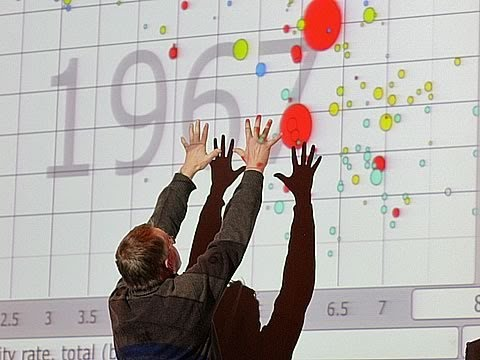

In [81]:
YouTubeVideo('usdJgEwMinM', 980,720)

In [82]:
df = pd.read_csv('http://www.stat.ubc.ca/~jenny/notOcto/STAT545A/examples/gapminder/data/gapminderDataFiveYear.txt', sep='\t')
df2007 = df[df.year==2007]
df1952 = df[df.year==1952]
df.head(2)

,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030


In [83]:
df2007.iplot(kind='scatter', mode='markers', x='gdpPercap', y='lifeExp')

It's not possible just yet to add multiple traces to a scatter plot with cufflinks.... so we have to drop down to plotly.

In [84]:
fig = {
    'data': [
        {'x': df2007.gdpPercap, 'y': df2007.lifeExp, 'text': df2007.country, 'mode': 'markers', 'name': '2007'},
        {'x': df1952.gdpPercap, 'y': df1952.lifeExp, 'text': df1952.country, 'mode': 'markers', 'name': '1952'}
    ],
    'layout': {
        'xaxis': {'title': 'GDP per Capita', 'type': 'log'},
        'yaxis': {'title': "Life Expectancy"}
    }
}
iplot(fig)

In the full dataset, you can look through your year values and use them like this:

In [85]:
iplot(
    {
        'data': [
            {
                'x': df[df['year']==year]['gdpPercap'],
                'y': df[df['year']==year]['lifeExp'],
                'text' : df[df['year']==year]['country'],
                'name': year, 'mode': 'markers',
            } for year in [1952, 1982, 2007]
        ],
        'layout': {
            'xaxis': {'title': 'GDP per Capita', 'type': 'log'},
            'yaxis': {'title': "Life Expectancy"}
        }
})

### Bubble Charts

Add `size` to create a bubble chart. Add hover text with the text attribute.

In [86]:
df2007.iplot(kind='bubble', x='gdpPercap', y='lifeExp', size='pop', text='country',
             xTitle='GDP per Capita', yTitle='Life Expectancy')

### Subplots

`subplots=True` partitions columns into separate subplots. Specify rows and columns with `shape=(rows, cols)` and share axes with `shared_xaxes=True` and `shared_yaxes=True`.

In [87]:
df=cf.datagen.lines(4)
df.iplot(subplots=True, shape=(4,1), shared_xaxes=True, fill=True)

Add subplot titles with `subplot_titles` as a list of titles or `True` to use column names.

In [88]:
df.iplot(subplots=True, subplot_titles=True, legend=False)

### Scatter Matrix

In [91]:
df

,YHR.GJ,PEM.SP,DGD.PN,OBI.CK
2015-01-01,0.468235,-1.436321,2.394451,-0.827945
2015-01-02,-0.814587,-2.930187,3.487018,1.509550
2015-01-03,-1.102478,-3.653881,4.026361,0.818334
2015-01-04,-1.400118,-2.830600,4.076632,0.379350
2015-01-05,0.422111,-2.996420,3.663822,-0.987946
2015-01-06,1.433022,-3.398383,2.671901,-2.503334
2015-01-07,0.817697,-2.143773,3.209798,-2.639335
2015-01-08,1.052684,-2.980815,3.610953,-4.495655
2015-01-09,0.042633,-0.616698,3.607196,-4.017990
2015-01-10,0.109900,-2.972803,3.579951,-3.531226


In [94]:
df.scatter_matrix()

### Heatmaps

In [96]:
cf.datagen.heatmap(20,20).iplot(kind='heatmap',colorscale='spectral')

### Lines & Shapes

Use `hline` and `vline` for horizontal and vertical lines.

In [97]:
df=cf.datagen.lines(3,columns=['a','b','c'])

In [98]:
df.iplot(hline=[2,4],vline=['2015-02-10'])

Draw shaded regions with `hspan`

In [99]:
df.iplot(hspan=[(-1,1),(2,5)])

Extra parameters can be passed in the form of dictionaries, width, fill, color, fillcolor, opacity

In [100]:
df.iplot(vspan={'x0':'2015-02-15','x1':'2015-03-15','color':'rgba(30,30,30,0.3)','fill':True,'opacity':.4})

## Customising Figures

`cufflinks` is designed for simple one-line charting with Pandas and Plotly. All of the Plotly chart attributes are not directly assignable in the `df.iplot` call signature.

To update attributes of a cufflinks chart that aren't available, first convert it to a figure `(asFigure=True)`, then tweak it, then plot it with `plotly.plotly.iplot`.

`cufflinks` generates these figure's that describe plotly graphs. For example, this graph:


In [101]:
df.iplot(kind='scatter')

has this description:

In [102]:
figure = df.iplot(kind='scatter', asFigure=True)
print figure.to_string()
# Or cf.pp(figure['layout'])

Figure(
    data=Data([
        Scatter(
            x=['2015-01-01', '2015-01-02', '2015-01-03', '2015-01-04', '..'  ],
            y=array([ -1.30217496,   0.04188689,  -0.13977563,  -0.85643163,..,
            line=Line(
                color='rgba(255, 153, 51, 1.0)',
                dash='solid',
                width=1.3
            ),
            mode='lines',
            name='a',
            text=''
        ),
        Scatter(
            x=['2015-01-01', '2015-01-02', '2015-01-03', '2015-01-04', '..'  ],
            y=array([ -2.19006214,  -1.77052815,  -1.51773228,  -2.5689821 ,..,
            line=Line(
                color='rgba(55, 128, 191, 1.0)',
                dash='solid',
                width=1.3
            ),
            mode='lines',
            name='b',
            text=''
        ),
        Scatter(
            x=['2015-01-01', '2015-01-02', '2015-01-03', '2015-01-04', '..'  ],
            y=array([ 0.18549959,  0.11484441,  0.58347891, -0.46302515,  0...,
 

So, if you want to edit any attribute of a Plotly graph from cufflinks, first convert it to a figure and then edit the figure objects. Let's add a yaxis title, tick suffixes, and new legend names to this example:

In [103]:
figure['layout']['yaxis1'].update({'title': 'Price', 'tickprefix': '$'})

for i, trace in enumerate(figure['data']):
    trace['name'] = 'Trace {}'.format(i)
    
iplot(figure)

To learn more about using plotly from python, head over to:
    
<h1 style="text-align:center
    "><a href="https://plot.ly/python/">Plotly for Python</a></h1>